In [3]:
import cv2
import numpy as np
import tensorflow as tf
from keras.models import load_model
import matplotlib.pyplot as plt
% matplotlib inline

In [931]:
img = cv2.imread('../data/new/img (13).png', cv2.IMREAD_GRAYSCALE)
# img = cv2.imread('../data/new/scantron4.jpg', cv2.IMREAD_GRAYSCALE)
thre, img = cv2.threshold(img, 220, 255, cv2.THRESH_BINARY_INV)

In [932]:
# plt.figure(figsize=(20,20))
# plt.imshow(img)
# plt.show()

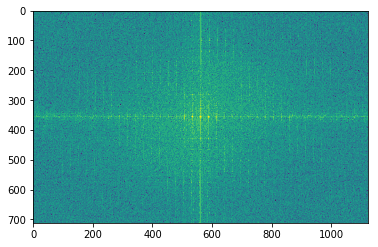

In [933]:
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude = np.log(np.abs(fshift))
magnitude_uint = magnitude.astype(np.uint8)
plt.imshow(magnitude_uint)

13.0


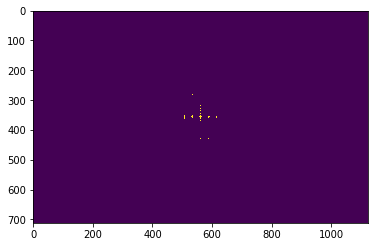

In [936]:
#二值化
magnitude_uint = magnitude.astype(np.uint8)
ret, thresh = cv2.threshold(magnitude_uint, 13, 255, cv2.THRESH_BINARY)
# ret, thresh = cv2.threshold(magnitude_uint, 11, 255, cv2.THRESH_BINARY)

print(ret)
plt.imshow(thresh)

In [945]:
#霍夫直线变换
# lines = cv2.HoughLinesP(thresh, 10, np.pi/180, 30, minLineLength=1500, maxLineGap=500)
lines = cv2.HoughLinesP(thresh, 10, np.pi/180, 30, minLineLength=200, maxLineGap=500)

print(len(lines))

6


(712, 1123)
(712, 1123)
pi 0.017453292519943295


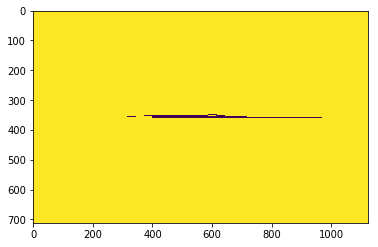

In [946]:
#创建一个新图像，标注直线
print(img.shape)
lineimg = np.ones(img.shape,dtype=np.uint8)
lineimg = lineimg * 255
print(lineimg.shape)
piThresh = np.pi/180
pi2 = np.pi/2
print('pi', piThresh)

for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(lineimg, (x1, y1), (x2, y2), (0, 255, 0), 2)
    if x2 - x1 == 0:
        continue
    else:
        theta = (y2 - y1) / (x2 - x1)
#     if abs(theta) < piThresh or abs(theta - pi2) < piThresh:
    if abs(theta) < piThresh or abs(theta - piThresh) < piThresh:
        continue
    else:
        print('theta', theta)
# plt.figure(figsize=(20, 20))
plt.imshow(lineimg)

argtan -0.01672084954280477
radian -0.9580341086759654
+90 89.04196589132404


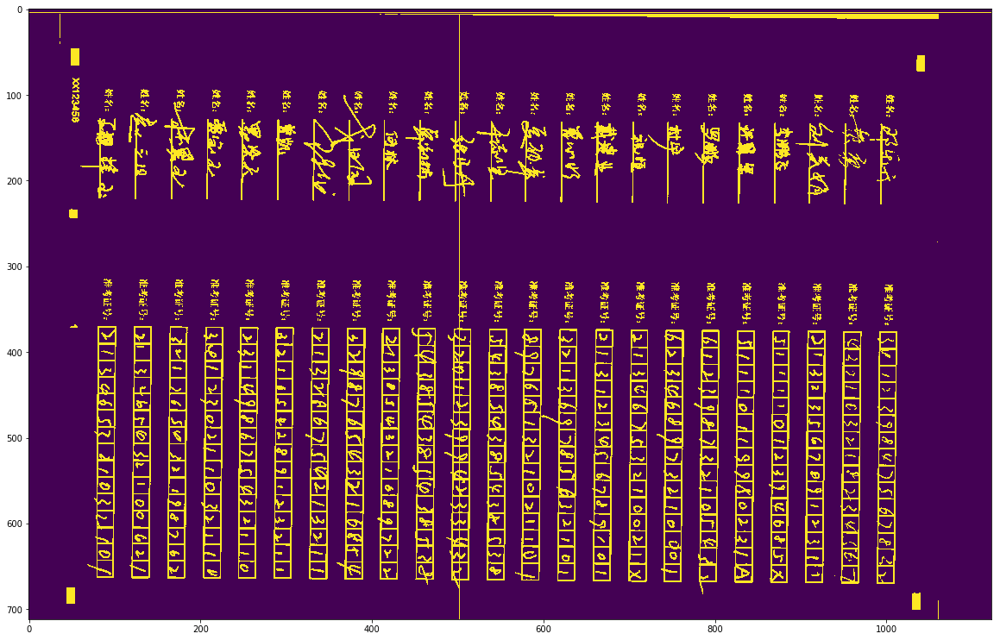

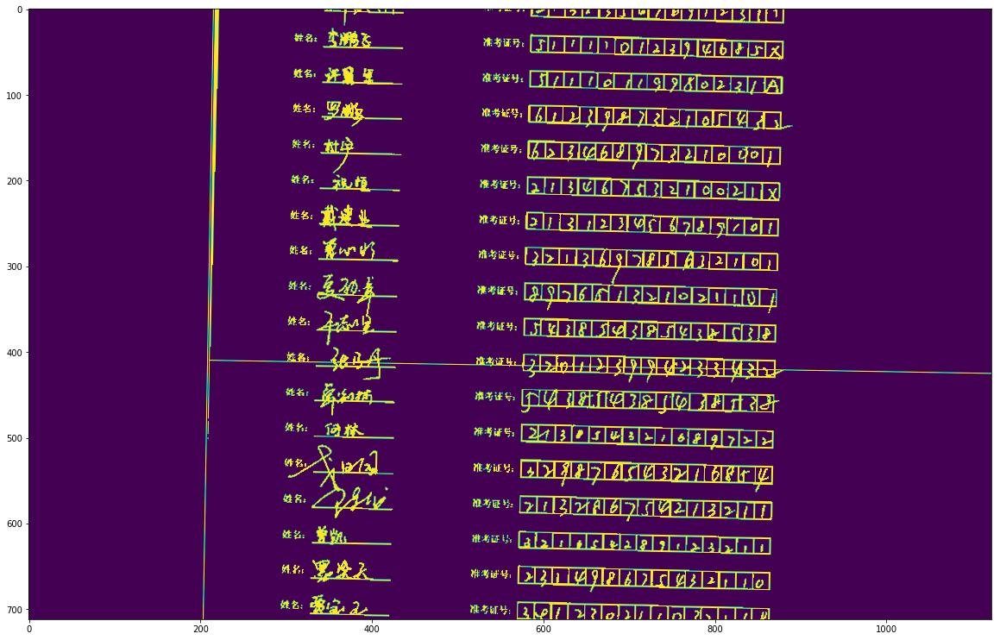

In [949]:
h, w = img.shape[:2]
import math

angle = math.atan(theta)
print('argtan', angle)
angle = angle * (180 / np.pi)

print('radian', angle)
# angle = (angle + 90)/(w/h)
angle = (angle + 90)
print('+90', angle) 
# angle = angle - 180

center = (w//2, h//2)
M = cv2.getRotationMatrix2D(center, angle, 1.0)

rotated = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
plt.figure(figsize=(20,20))
plt.imshow(img)
plt.show()
plt.figure(figsize=(20,20))
plt.imshow(rotated)
plt.show()

In [851]:
cv2.imwrite(r'D:\pyproj\num_reco\data\new\cjd12.jpg', rotated)

True

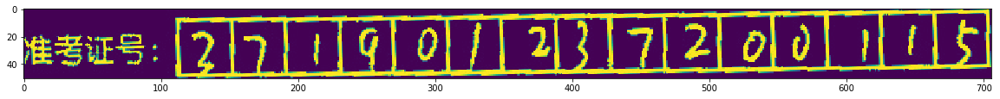

3
pi 0.017453292519943295


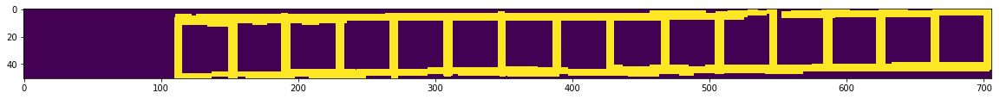

In [911]:
strip = cv2.imread('../data/ques_item/9764.jpg', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(20, 20))
plt.imshow(strip)
plt.show()

#霍夫直线变换
lines_h = cv2.HoughLinesP(strip, 1, np.pi / 180, 30, minLineLength=40, maxLineGap=0)
lines_v = cv2.HoughLinesP(strip, 1, np.pi, 30, minLineLength=40, maxLineGap=0)
print(len(lines))

#创建一个新图像，标注直线
# bgr = cv2.imread('../data/ques_item/3239.jpg')
lineimg = np.ones(strip.shape,dtype=np.uint8)
lineimg = lineimg * 255
piThresh = np.pi/180
pi2 = np.pi/2
print('pi', piThresh)

for line in lines_h:
    x1, y1, x2, y2 = line[0]
    theta = (y2 - y1) / (x2 - x1 + 1e-4)
#     print(math.atan(theta))
#     print(line[0])
    cv2.line(lineimg, (x1, y1), (x2, y2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1, y1 - 1), (x2, y2 - 1), (0, 255, 0), 1)
    cv2.line(lineimg, (x1, y1 - 2), (x2, y2 - 2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1, y1 + 1), (x2, y2 + 1), (0, 255, 0), 1)
    cv2.line(lineimg, (x1, y1 + 2), (x2, y2 + 2), (0, 255, 0), 1)

for line in lines_v:
    x1, y1, x2, y2 = line[0]
    theta = (y2 - y1) / (x2 - x1 + 1e-4)
#     print(math.atan(theta))
#     print(line[0])
    cv2.line(lineimg, (x1, y1), (x2, y2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1 - 1, y1), (x2 - 1, y2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1 - 2, y1), (x2 - 2, y2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1 + 1, y1), (x2 + 1, y2), (0, 255, 0), 1)
    cv2.line(lineimg, (x1 + 2, y1), (x2 + 2, y2), (0, 255, 0), 1)

lineimg = 255 - lineimg
plt.figure(figsize=(20, 20))
plt.imshow(lineimg)

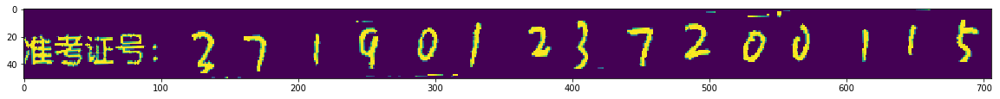

In [912]:
strip[lineimg > 0] = 0
strip = strip / 255
strip[strip < 0.16] = 0
plt.figure(figsize=(20, 20))
plt.imshow(strip)

In [913]:
from core.img_process import *
from core.processor import *
regions = cut(strip, row_eps=img.shape[1] / 30, col_eps=1, display=False)
save_all_regions(regions, dir_name=['../data/ques', '../data/nums'])

---

In [916]:
import shutil

p = r'F:\hand_writing\nums'
model = load_model('cnn3_gen_1.3_ftn.h5')

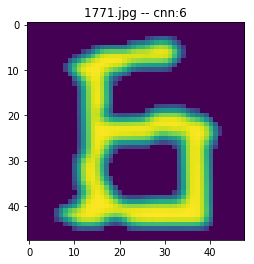

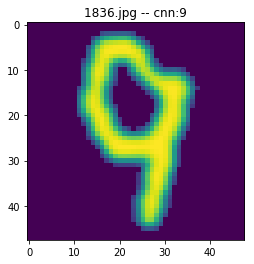

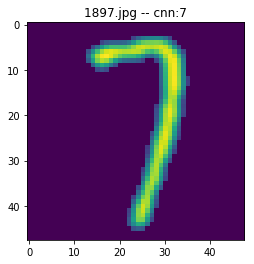

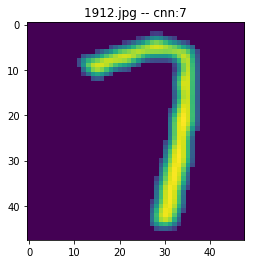

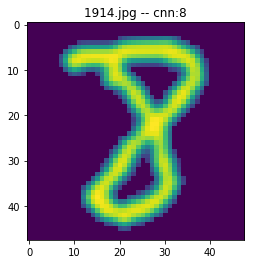

...

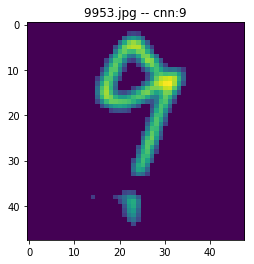

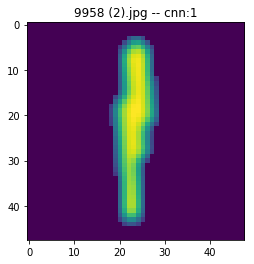

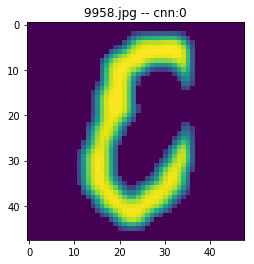

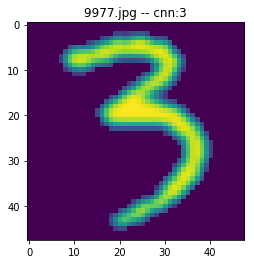

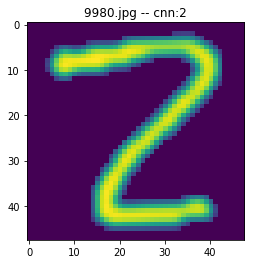

In [920]:
for fname in os.listdir(p):
    jp = os.path.join(p, fname)
    if os.path.isdir(jp): continue
    
    ori = cv2.imread(jp, cv2.IMREAD_GRAYSCALE)
    
    img = ori / 255.
    img = cv2.GaussianBlur(img, (5, 5), 0)
    img[img < 0.16] = 0
    
    pred = np.argmax(model.predict(np.expand_dims(np.expand_dims(img, axis=-1), axis=0)))
    plt.title('%s -- cnn:%s' % (fname, pred))
    plt.imshow(img)
    plt.show()
    
    if not os.path.exists(os.path.join(p, str(pred))):
        os.mkdir(os.path.join(p, str(pred)))
    shutil.copyfile(jp, os.path.join(p, str(pred), fname))
    